
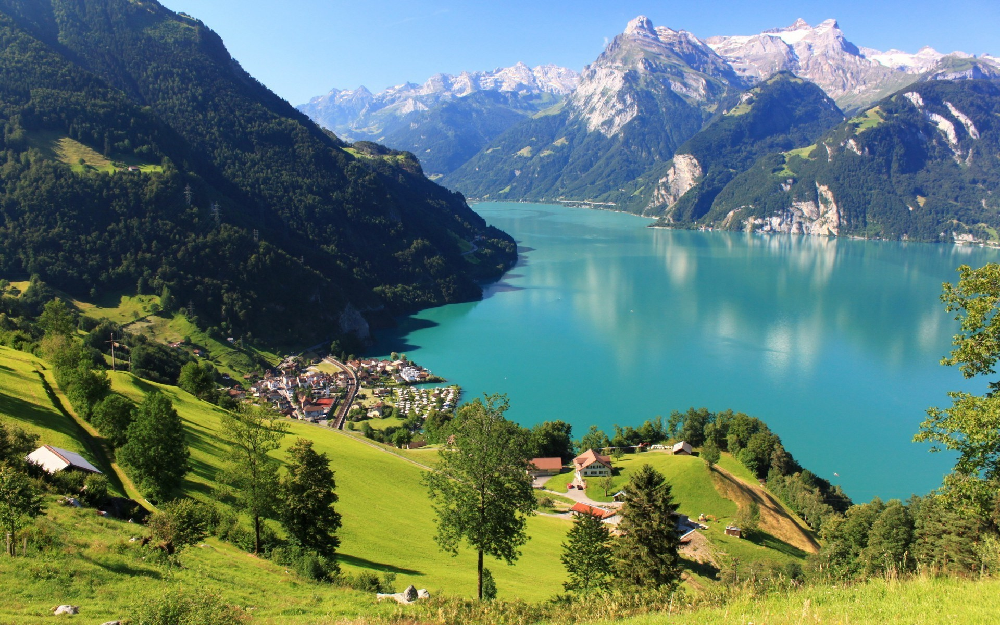

# Intel Image Classification

In this notebook, we are going to classify image 6 different types of image scene (multicalss classification). The data comes from [Kaggle.com](https://www.kaggle.com/datasets/puneet6060/intel-image-classification) and  contains around 25k images of size 150x150 distributed under 6 categories which are:

- buildings -> 0
- forest -> 1
- glacier -> 2
- mountain -> 3
- sea -> 4
- street -> 5


The Train, Test and Prediction data is separated in each zip files. There are around 14k images in Train, 3k in Test and 7k in Prediction.

---


### What we are going to do:
1. Load the data and extract the data
2. Visualize the data
3. Turn the data into batch
4. Create a baseline model and fit the data
5. Create other models to beat the baseline
6. Try to beat the models that beat the baseline
7. Use data augmentation
8. Use a pretrained model
9. Evaluate the best models
10. Check the most wrong predictions
11. Test the models on the real world data




## 1. Load and extract the data

In [1]:
import zipfile

data_path = 'drive/MyDrive/DataScience/DeepLearning/Tensorflow/Practice/Datasets/intel.zip'

zip = zipfile.ZipFile(data_path)
zip.extractall()
zip.close()

In [2]:
import os

train_dir = 'intel/train'
val_dir = 'intel/val'
test_dir = 'intel/test'

for dirpath, dirnames, filenames in os.walk('intel'):
  print(f'There is {len(dirnames)} directories and {len(filenames)} files in {dirpath}')

There is 3 directories and 0 files in intel
There is 6 directories and 0 files in intel/train
There is 0 directories and 2274 files in intel/train/sea
There is 0 directories and 2512 files in intel/train/mountain
There is 0 directories and 2404 files in intel/train/glacier
There is 0 directories and 2382 files in intel/train/street
There is 0 directories and 2271 files in intel/train/forest
There is 0 directories and 2191 files in intel/train/buildings
There is 0 directories and 7301 files in intel/test
There is 6 directories and 0 files in intel/val
There is 0 directories and 510 files in intel/val/sea
There is 0 directories and 525 files in intel/val/mountain
There is 0 directories and 553 files in intel/val/glacier
There is 0 directories and 501 files in intel/val/street
There is 0 directories and 474 files in intel/val/forest
There is 0 directories and 437 files in intel/val/buildings


## 2. Visualize the data

In [3]:
# plot the data distribution

train_files_len = []

for classname in os.listdir(train_dir):
  train_files_len.append(len(os.listdir(os.path.join(train_dir, classname))))

train_files_len

[2274, 2512, 2404, 2382, 2271, 2191]

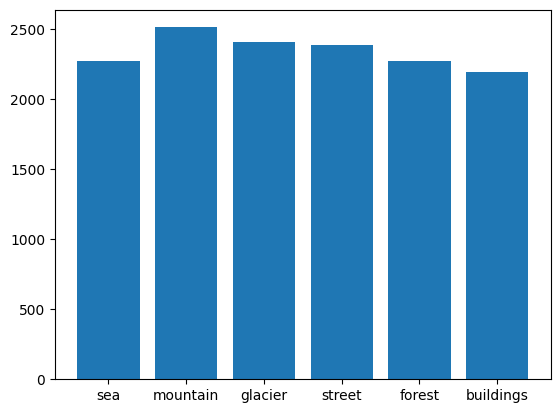

In [4]:
import matplotlib.pyplot as plt

plt.bar(os.listdir(train_dir), train_files_len);

Very good, the data looks balenced. Now let's randomly plot each image category.

In [5]:
import random

def plot_img(parent_dir):
  classnames = os.listdir(parent_dir)

  plt.figure(figsize=(10, 6))

  for i in range(len(classnames)):
    plt.subplot(3, 3, i+1)
    img_name = random.choice(os.listdir(os.path.join(parent_dir, classnames[i])))
    img_path = os.path.join(parent_dir, classnames[i], img_name)
    plt.imshow(plt.imread(img_path))
    plt.title(classnames[i])
    plt.axis(False)


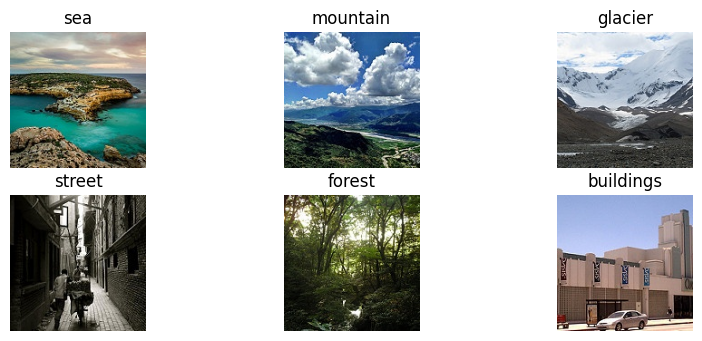

In [6]:
plot_img(train_dir)

## 3. Turn the data into batch

In [7]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

BATCH_SIZE = 32
IMG_SHAPE = (224, 224)


image_datagen = ImageDataGenerator(rescale=1./255)

train_data = image_datagen.flow_from_directory(directory=train_dir,
                                               target_size=IMG_SHAPE,
                                               batch_size=BATCH_SIZE,
                                               class_mode='categorical',
                                               seed=42,
                                               shuffle=True
                                               )

val_data = image_datagen.flow_from_directory(directory=val_dir,
                                               target_size=IMG_SHAPE,
                                               batch_size=BATCH_SIZE,
                                               class_mode='categorical',
                                               seed=42,
                                               shuffle=False)

test_data = image_datagen.flow_from_directory('intel',
                                              classes=['test'],
                                              target_size=IMG_SHAPE,
                                              batch_size=BATCH_SIZE,
                                              class_mode=None)


Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.
Found 7301 images belonging to 1 classes.


In [67]:
# let's turn the test data into a dataframe
# import pandas as pd

# test_df = pd.DataFrame({"filename": os.listdir(test_dir)})


# test_data = image_datagen.flow_from_dataframe(
#     dataframe=test_df,
#     directory=test_dir,
#     y_col=None,
#     x_col='filename',
#     target_size=(150, 150),
#     batch_size=BATCH_SIZE,
#     class_mode=None,
# )

Found 7301 validated image filenames.


In [8]:
classnames = list(train_data.class_indices.keys())
classnames


['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']

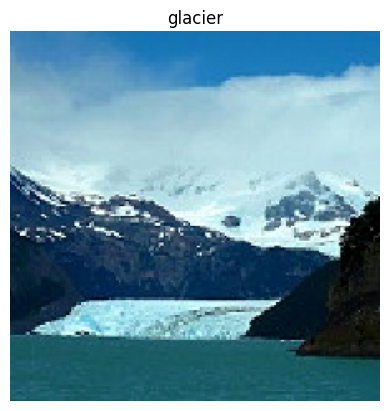

In [9]:
# let's visualize the data inside the batch

img, labels = train_data.next()

random_img = random.randint(0, 31)
plt.imshow(img[random_img])
plt.title(classnames[labels[random_img].argmax()])
plt.axis(False);


In [10]:
def plot_loss_curve(history, model_name):
  model_history = history.history

  train_accuracy = model_history['accuracy']
  train_loss = model_history['loss']

  val_accuracy = model_history['val_accuracy']
  val_loss = model_history['val_loss']

  epochs = range(len(train_accuracy))

  plt.plot(epochs, train_accuracy, label='train_accuracy')
  plt.plot(epochs, val_accuracy, label='val_accuracy')
  plt.title(f'{model_name} train accuracy')
  plt.legend()

  plt.figure()

  plt.plot(epochs, train_loss, label='train_loss')
  plt.plot(epochs, val_loss, label='val_loss')
  plt.title(f'{model_name} train loss')
  plt.legend()

## 4.  Create a baseline model and fit the data

In [11]:
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import (Dense, Conv2D, Dropout, BatchNormalization, Flatten,
                                     GlobalAvgPool2D, MaxPool2D, GlobalMaxPool2D, AvgPool2D)
from tensorflow.keras.activations import relu, softmax
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.losses import CategoricalCrossentropy

In [ ]:
model_0 = Sequential([
    Conv2D(filters=8,
           kernel_size=3,
           strides=1,
           padding='valid',
           activation=relu,
           input_shape=(224, 224, 3), name='input_layer'),
    Conv2D(filters=16,
           kernel_size=3,
           activation=relu),
    Conv2D(filters=32,
           kernel_size=3,
           activation=relu),
    MaxPool2D(),
    Flatten(),
    Dense(6, activation=softmax, name='output_layer')
])

model_0.compile(loss=CategoricalCrossentropy(),
                optimizer=Adam(),
                metrics=['accuracy'])

model_0.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (Conv2D)        (None, 148, 148, 8)       224       
                                                                 
 conv2d_5 (Conv2D)           (None, 146, 146, 16)      1168      
                                                                 
 conv2d_6 (Conv2D)           (None, 144, 144, 32)      4640      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 72, 72, 32)       0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 165888)            0         
                                                                 
 output_layer (Dense)        (None, 6)                 995334    
                                                      

In [ ]:
history_0 = model_0.fit(train_data,
            validation_data=val_data,
            steps_per_epoch=len(train_data),
            validation_steps=len(val_data),
            epochs=5)

Epoch 1/5
439/439 [==============================] - 37s 53ms/step - loss: 0.9160 - accuracy: 0.6665 - val_loss: 0.6665 - val_accuracy: 0.7647
Epoch 2/5
439/439 [==============================] - 25s 56ms/step - loss: 0.5167 - accuracy: 0.8226 - val_loss: 0.7480 - val_accuracy: 0.7377
Epoch 3/5
439/439 [==============================] - 22s 51ms/step - loss: 0.2525 - accuracy: 0.9207 - val_loss: 0.7448 - val_accuracy: 0.7790
Epoch 4/5
439/439 [==============================] - 24s 55ms/step - loss: 0.0984 - accuracy: 0.9745 - val_loss: 1.0014 - val_accuracy: 0.7453
Epoch 5/5
439/439 [==============================] - 22s 50ms/step - loss: 0.0546 - accuracy: 0.9882 - val_loss: 1.0559 - val_accuracy: 0.7727


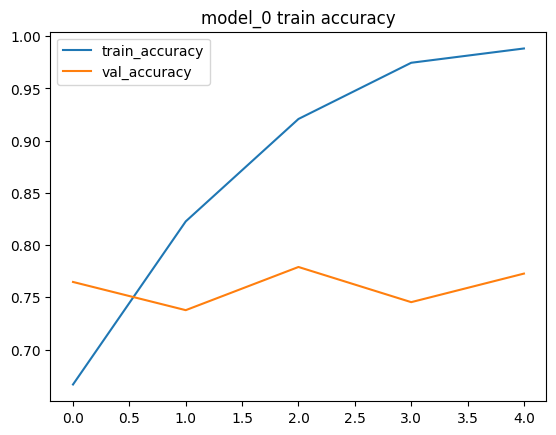

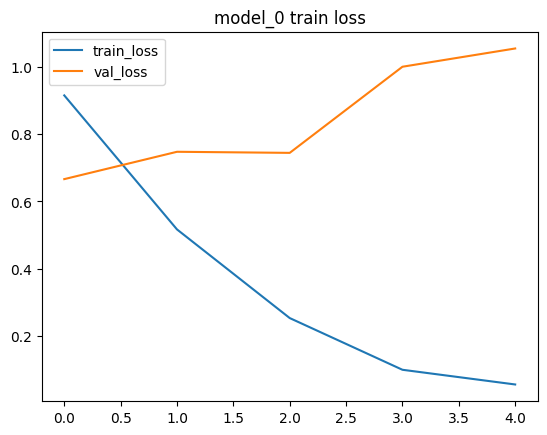

In [ ]:
plot_loss_curve(history_0, 'model_0')

Okay we can see that the model overfit with an accuracy of 74%. Let's build a stronger model

## 5. Create other models to beat the baseline

In [ ]:
model_1 = Sequential([
    Conv2D(filters=32,
           kernel_size=3,
           padding='valid',
           strides=1,
           activation=relu,
           input_shape=(224, 224, 3), name='input_layer'),
    Conv2D(32, 3, activation=relu),
    MaxPool2D(),
    Conv2D(32, 3, activation=relu),
    Conv2D(32, 3, activation=relu),
    MaxPool2D(),
    Flatten(),
    Dense(6, activation=softmax, name='output_layer')
])

model_1.compile(loss=CategoricalCrossentropy(),
                optimizer=Adam(),
                metrics=['accuracy'])

model_1.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (Conv2D)        (None, 148, 148, 32)      896       
                                                                 
 conv2d_2 (Conv2D)           (None, 146, 146, 32)      9248      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 73, 73, 32)       0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 71, 71, 32)        9248      
                                                                 
 conv2d_4 (Conv2D)           (None, 69, 69, 32)        9248      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 34, 34, 32)       0         
 2D)                                                  

In [ ]:
history_1 = model_1.fit(train_data,
                        validation_data=val_data,
                        steps_per_epoch=len(train_data),
                        validation_steps=len(val_data),
                        epochs=5)


Epoch 1/5
439/439 [==============================] - 30s 60ms/step - loss: 0.9088 - accuracy: 0.6505 - val_loss: 0.7850 - val_accuracy: 0.7017
Epoch 2/5
439/439 [==============================] - 23s 53ms/step - loss: 0.5948 - accuracy: 0.7842 - val_loss: 0.6067 - val_accuracy: 0.7840
Epoch 3/5
439/439 [==============================] - 26s 58ms/step - loss: 0.4655 - accuracy: 0.8344 - val_loss: 0.6097 - val_accuracy: 0.7833
Epoch 4/5
439/439 [==============================] - 24s 54ms/step - loss: 0.3413 - accuracy: 0.8782 - val_loss: 0.6418 - val_accuracy: 0.7917
Epoch 5/5
439/439 [==============================] - 27s 62ms/step - loss: 0.2180 - accuracy: 0.9248 - val_loss: 0.8240 - val_accuracy: 0.7757


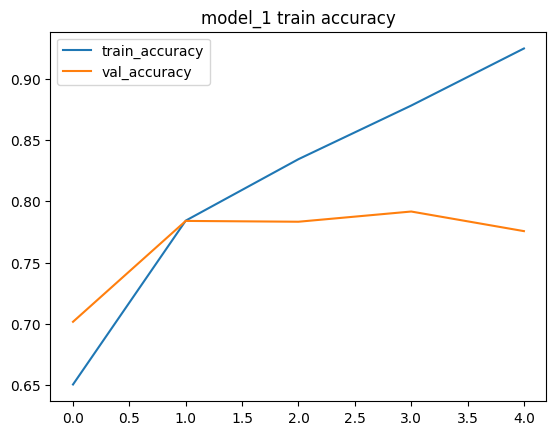

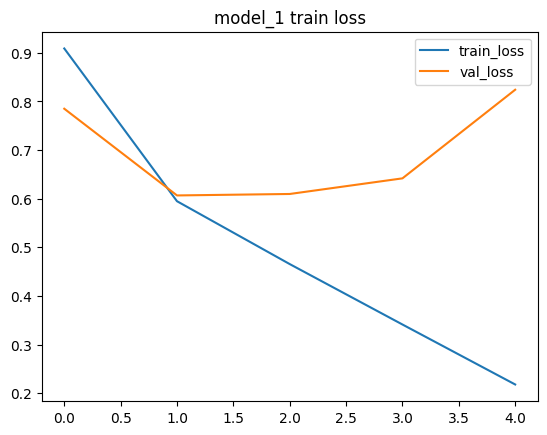

In [ ]:
plot_loss_curve(history_1, 'model_1')

Hmmm nothing seems to have changed..Let's build another model

In [ ]:
model_2 = Sequential([
    Conv2D(filters=64,
           kernel_size=3,
           strides=1,
           padding='valid',
           activation=relu,
           input_shape=(224, 224, 3), name='input_layer'),
    MaxPool2D(),
    Conv2D(64, 3, activation=relu),
    MaxPool2D(),
    Conv2D(64, 3, activation=relu),
    MaxPool2D(),
    Conv2D(64, 3, activation=relu),
    MaxPool2D(),
    Flatten(),
    Dense(6 , activation=softmax, name='output_layer')
])

model_2.compile(loss=CategoricalCrossentropy(),
                optimizer=Adam(),
                metrics=['accuracy'])

model_2.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (Conv2D)        (None, 148, 148, 64)      1792      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 74, 74, 64)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 72, 72, 64)        36928     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 34, 34, 64)        36928     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 17, 17, 64)      

In [ ]:
history_2 = model_2.fit(train_data,
                        validation_data=val_data,
                        steps_per_epoch=len(train_data),
                        validation_steps=len(val_data),
                        epochs=5)

Epoch 1/5
439/439 [==============================] - 28s 57ms/step - loss: 1.0331 - accuracy: 0.5883 - val_loss: 0.8389 - val_accuracy: 0.6707
Epoch 2/5
439/439 [==============================] - 26s 59ms/step - loss: 0.7164 - accuracy: 0.7347 - val_loss: 0.6857 - val_accuracy: 0.7460
Epoch 3/5
439/439 [==============================] - 23s 53ms/step - loss: 0.6022 - accuracy: 0.7823 - val_loss: 0.5516 - val_accuracy: 0.8007
Epoch 4/5
439/439 [==============================] - 23s 53ms/step - loss: 0.5298 - accuracy: 0.8070 - val_loss: 0.5819 - val_accuracy: 0.7910
Epoch 5/5
439/439 [==============================] - 24s 55ms/step - loss: 0.4823 - accuracy: 0.8270 - val_loss: 0.5545 - val_accuracy: 0.8033


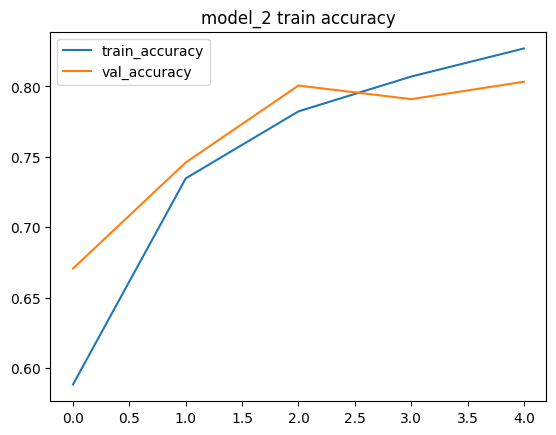

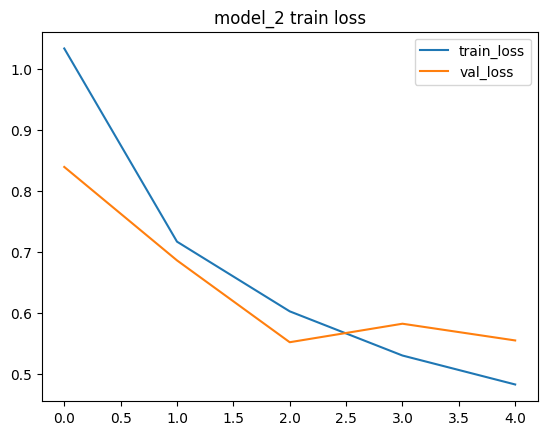

In [ ]:
plot_loss_curve(history_2, 'model_2')

Now we are getting better results. This model succesfully beat the baseline model with an accuracy above 80% without overfitting which is quite good.

## 6. Try to beat the models that beat the baseline.

80% accuracy is good but we can do better. Let's build other models to have better performences

In [ ]:
model_3 = Sequential([
    Conv2D(filters=128,
           kernel_size=3,
           strides=1,
           padding='valid',
           activation=relu,
           input_shape=(224, 224, 3), name='input_layer'),
    MaxPool2D(),
    Conv2D(128, 3, activation=relu),
    MaxPool2D(),
    Conv2D(128, 3, activation=relu),
    MaxPool2D(),
    Conv2D(128, 3, activation=relu),
    MaxPool2D(),
    Flatten(),
    Dense(6 , activation=softmax, name='output_layer')
])

model_3.compile(loss=CategoricalCrossentropy(),
                optimizer=Adam(),
                metrics=['accuracy'])

model_3.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (Conv2D)        (None, 148, 148, 128)     3584      
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 74, 74, 128)      0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 72, 72, 128)       147584    
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 36, 36, 128)      0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 34, 34, 128)       147584    
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 17, 17, 128)     

In [ ]:
history_3 = model_3.fit(train_data,
                        validation_data=val_data,
                        steps_per_epoch=len(train_data),
                        validation_steps=len(val_data),
                        epochs=5)

Epoch 1/5
439/439 [==============================] - 38s 78ms/step - loss: 1.0631 - accuracy: 0.5760 - val_loss: 0.9893 - val_accuracy: 0.6273
Epoch 2/5
439/439 [==============================] - 31s 71ms/step - loss: 0.7587 - accuracy: 0.7106 - val_loss: 0.6796 - val_accuracy: 0.7437
Epoch 3/5
439/439 [==============================] - 31s 70ms/step - loss: 0.5998 - accuracy: 0.7830 - val_loss: 0.5931 - val_accuracy: 0.7923
Epoch 4/5
439/439 [==============================] - 31s 70ms/step - loss: 0.5101 - accuracy: 0.8173 - val_loss: 0.4923 - val_accuracy: 0.8243
Epoch 5/5
439/439 [==============================] - 32s 73ms/step - loss: 0.4353 - accuracy: 0.8417 - val_loss: 0.5156 - val_accuracy: 0.8213


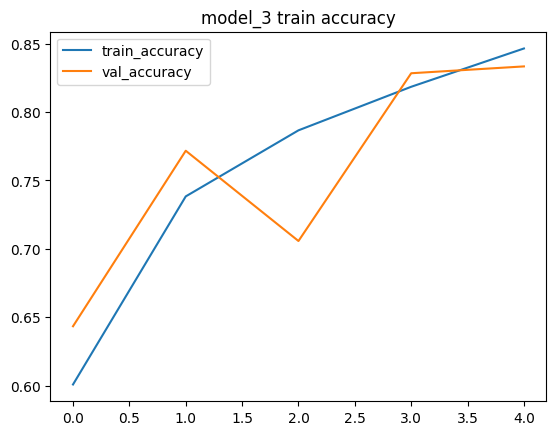

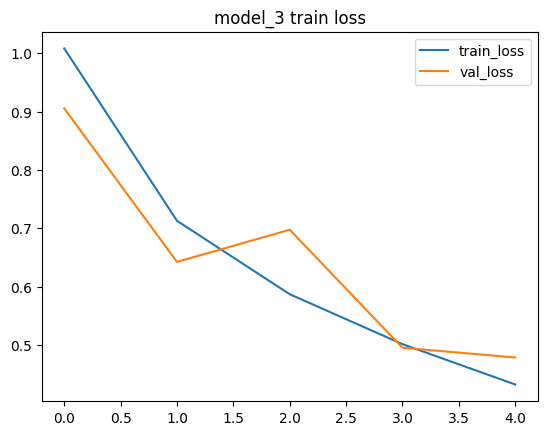

In [ ]:
plot_loss_curve(history_3, 'model_3')

Increasing the number of filters lead to a very tiny improvement but is still an improvement, but we can do better

In [ ]:
model_4 = Sequential([
    Conv2D(filters=128,
           kernel_size=3,
           strides=1,
           padding='valid',
           activation=relu,
           input_shape=(224, 224, 3), name='input_layer'),
    AvgPool2D(),
    Dropout(0.25),

    Conv2D(128, 3, activation=relu),
    AvgPool2D(),
    Dropout(0.25),

    Conv2D(128, 3, activation=relu),
    AvgPool2D(),
    Dropout(0.25),

    Conv2D(128, 3, activation=relu),
    AvgPool2D(),
    Dropout(0.25),

    GlobalAvgPool2D(),
    Dense(100, activation=relu),
    # Flatten(),
    Dense(6 , activation=softmax, name='output_layer')
])

model_4.compile(loss=CategoricalCrossentropy(),
                optimizer=Adam(),
                metrics=['accuracy'])

model_4.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (Conv2D)        (None, 148, 148, 128)     3584      
                                                                 
 average_pooling2d (AverageP  (None, 74, 74, 128)      0         
 ooling2D)                                                       
                                                                 
 dropout (Dropout)           (None, 74, 74, 128)       0         
                                                                 
 conv2d (Conv2D)             (None, 72, 72, 128)       147584    
                                                                 
 average_pooling2d_1 (Averag  (None, 36, 36, 128)      0         
 ePooling2D)                                                     
                                                                 
 dropout_1 (Dropout)         (None, 36, 36, 128)       0

In [ ]:
history_4 = model_4.fit(train_data,
                        validation_data=val_data,
                        steps_per_epoch=len(train_data),
                        validation_steps=len(val_data),
                        epochs=30)

Epoch 1/10
439/439 [==============================] - 44s 101ms/step - loss: 0.3288 - accuracy: 0.8772 - val_loss: 0.3813 - val_accuracy: 0.8633
Epoch 2/10
439/439 [==============================] - 44s 101ms/step - loss: 0.3205 - accuracy: 0.8847 - val_loss: 0.3857 - val_accuracy: 0.8623
Epoch 3/10
439/439 [==============================] - 44s 100ms/step - loss: 0.3158 - accuracy: 0.8833 - val_loss: 0.4051 - val_accuracy: 0.8560
Epoch 4/10
439/439 [==============================] - 44s 100ms/step - loss: 0.3032 - accuracy: 0.8876 - val_loss: 0.3804 - val_accuracy: 0.8653
Epoch 5/10
439/439 [==============================] - 45s 103ms/step - loss: 0.3028 - accuracy: 0.8872 - val_loss: 0.3675 - val_accuracy: 0.8693
Epoch 6/10
439/439 [==============================] - 44s 101ms/step - loss: 0.2897 - accuracy: 0.8946 - val_loss: 0.3547 - val_accuracy: 0.8750
Epoch 7/10
439/439 [==============================] - 44s 101ms/step - loss: 0.2841 - accuracy: 0.8940 - val_loss: 0.3889 - val_ac

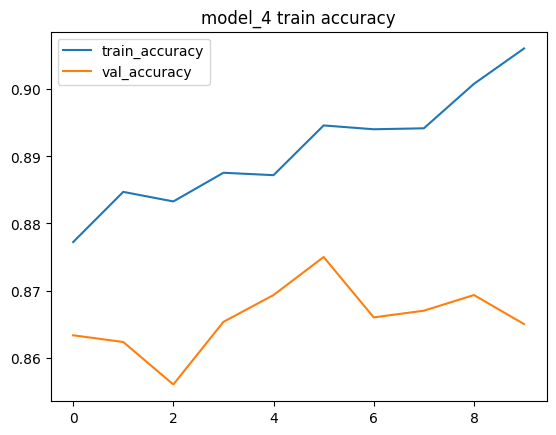

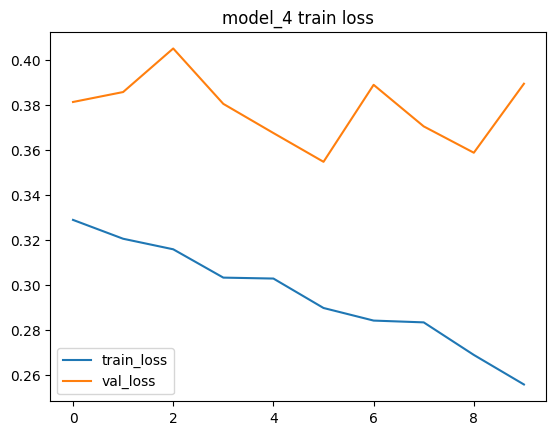

In [ ]:
plot_loss_curve(history_4, 'model_4')

It seems that after training our model for too long, it started to overfit but the validation accuracy (86 percent) is quite good than the precendent model. Now let's use this model architectuture and fit it on the augmented data

In [ ]:
# let's save the model
model_4.save('model_4.h5')

## 7. Use data augmentation

In [12]:
# Create augmented data

image_datagen = ImageDataGenerator(rescale=1/255.,
                                    rotation_range=0.2,
                                    shear_range=0.2,
                                    zoom_range=0.2,
                                    width_shift_range=0.2,
                                    height_shift_range=0.2,
                                    horizontal_flip=True)

train_data_aug = image_datagen.flow_from_directory(directory=train_dir,
                                                   target_size=IMG_SHAPE,
                                                   batch_size=32,
                                                   seed=42,
                                                   class_mode='categorical')

Found 14034 images belonging to 6 classes.


In [ ]:
# let's plot random images and their augmented data

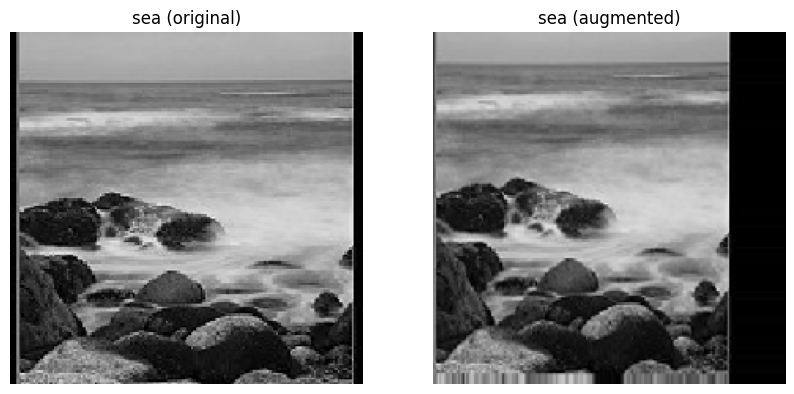

In [13]:
# take a random batch (goes from 0 to 439)
random_batch = random.randint(0, len(train_data_aug))
# augmented images
imgs_aug, labels = train_data_aug[random_batch]
# non augmented images
imgs, _ = train_data[random_batch]


# get the random image and its appropriate label
random_img_label = random.randint(0, len(imgs_aug))

# plot the original image and the augmented one
plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
plt.imshow(imgs[random_img_label])
plt.title(f'{classnames[labels[random_img_label].argmax()]} (original)')
plt.axis(False)

plt.subplot(1, 2, 2)
plt.imshow(imgs_aug[random_img_label])
plt.title(f'{classnames[labels[random_img_label].argmax()]} (augmented)')
plt.axis(False);


In [ ]:
# let's clone model_4 and fit it to the augmented data
from tensorflow.keras.models import clone_model

model_4_cloned = clone_model(model_4)
model_4_cloned.summary()

In [ ]:
model_4_cloned.compile(loss=CategoricalCrossentropy(),
                       optimizer=Adam(),
                       metrics=["accuracy"])

history_4_cloned = model_4_cloned.fit(train_data_aug,
                                      validation_data=val_data,
                                      steps_per_epoch=len(train_data),
                                      validation_steps=len(val_data),
                                      epochs=10)

Epoch 1/10
439/439 [==============================] - 108s 237ms/step - loss: 1.2511 - accuracy: 0.4718 - val_loss: 1.2206 - val_accuracy: 0.5117
Epoch 2/10
439/439 [==============================] - 102s 232ms/step - loss: 1.0010 - accuracy: 0.6012 - val_loss: 0.7601 - val_accuracy: 0.7233
Epoch 3/10
439/439 [==============================] - 103s 235ms/step - loss: 0.8729 - accuracy: 0.6612 - val_loss: 0.6909 - val_accuracy: 0.7337
Epoch 4/10
439/439 [==============================] - 101s 230ms/step - loss: 0.7920 - accuracy: 0.6955 - val_loss: 0.7764 - val_accuracy: 0.7073
Epoch 5/10
439/439 [==============================] - 105s 238ms/step - loss: 0.7172 - accuracy: 0.7329 - val_loss: 0.6053 - val_accuracy: 0.7753
Epoch 6/10
439/439 [==============================] - 104s 237ms/step - loss: 0.6726 - accuracy: 0.7501 - val_loss: 0.5349 - val_accuracy: 0.8150
Epoch 7/10
439/439 [==============================] - 102s 232ms/step - loss: 0.6251 - accuracy: 0.7663 - val_loss: 0.5822 -

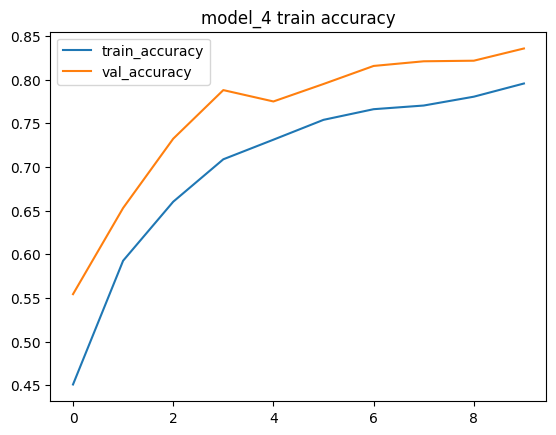

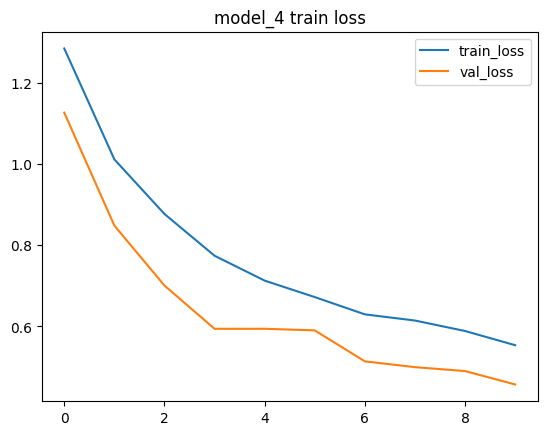

In [ ]:
plot_loss_curve(history_4_cloned, 'model_4')

It seems that the loss curve keep deacreasing, therefore if we train the model for longer, we can have a better accuracy. Let's try that

In [ ]:

history_4_cloned = model_4_cloned.fit(train_data_aug,
                                      validation_data=val_data,

                                      steps_per_epoch=len(train_data),
                                      validation_steps=len(val_data),
                                      epochs=30)

Epoch 1/30
439/439 [==============================] - 111s 253ms/step - loss: 0.5392 - accuracy: 0.7995 - val_loss: 0.5174 - val_accuracy: 0.8093
Epoch 2/30
439/439 [==============================] - 102s 232ms/step - loss: 0.5259 - accuracy: 0.8048 - val_loss: 0.4473 - val_accuracy: 0.8380
Epoch 3/30
439/439 [==============================] - 100s 229ms/step - loss: 0.5112 - accuracy: 0.8102 - val_loss: 0.5050 - val_accuracy: 0.8103
Epoch 4/30
439/439 [==============================] - 102s 233ms/step - loss: 0.5052 - accuracy: 0.8143 - val_loss: 0.4537 - val_accuracy: 0.8307
Epoch 5/30
439/439 [==============================] - 100s 227ms/step - loss: 0.5037 - accuracy: 0.8144 - val_loss: 0.4773 - val_accuracy: 0.8270
Epoch 6/30
439/439 [==============================] - 102s 232ms/step - loss: 0.4789 - accuracy: 0.8204 - val_loss: 0.4595 - val_accuracy: 0.8350
Epoch 7/30
439/439 [==============================] - 99s 226ms/step - loss: 0.4729 - accuracy: 0.8249 - val_loss: 0.4605 - 

After fitting the model for 30 epochs, the model gets stuck at an accuracy of 86%, which is quite good. But there is always some room for improvements. Let's try to build another model with a diiferent architure to see if we can reach better results on the augmented data

In [17]:
model_5 = Sequential([
    Conv2D(filters=128,
           kernel_size=3,
           padding='valid',
           strides=1,
           activation=relu,
           input_shape=(224, 224, 3)),
    MaxPool2D(),
    Dropout(0.25),
    Conv2D(128, 3, activation=relu),
    MaxPool2D(),
    Dropout(0.25),
    Conv2D(128, 3, activation=relu),
    MaxPool2D(),
    Dropout(0.25),
    Conv2D(128, 3, activation=relu),
    MaxPool2D(),
    Dropout(0.25),
    Conv2D(256, 3, activation=relu),
    Flatten(),
    Dense(256, activation=relu),
    Dense(6, activation=softmax)
])

model_5.compile(loss=CategoricalCrossentropy(),
                optimizer=Adam(),
                metrics=["accuracy"])


In [ ]:
# model_5 = tf.keras.models.load_model('drive/MyDrive/model_5.h5')

In [ ]:
history_5 = model_5.fit(train_data_aug,
                                      validation_data=val_data,
                                      steps_per_epoch=len(train_data),
                                      validation_steps=len(val_data),
                                      epochs=30)


By using a different model architecture and by training the model for 30 epochs as well we reached sligthly better results, with an accuracy of 87%. Now Let's use a pretrained model

## 8. Use a pretrained model

Let's use the inception_resnet first to see how it performs, then use other pretrained models afterwards

In [19]:
import tensorflow_hub as hub

In [ ]:
inception_resnet_v2_link = 'https://tfhub.dev/google/imagenet/inception_resnet_v2/classification/5'


inception_resnet_v2 = Sequential([
    hub.KerasLayer(inception_resnet_v2_link,
                   trainable=False,
                   input_shape=(224, 224, 3)),
    Dense(6, activation=softmax)
])


In [ ]:

inception_resnet_v2.compile(loss=CategoricalCrossentropy(),
                       optimizer=Adam(),
                       metrics=['accuracy'])

inception_resnet_v2.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_10 (KerasLayer)  (None, 1001)             55875273  
                                                                 
 dense_10 (Dense)            (None, 6)                 6012      
                                                                 
Total params: 55,881,285
Trainable params: 6,012
Non-trainable params: 55,875,273
_________________________________________________________________


In [ ]:
inception_resnet_v2.fit(train_data,
                   validation_data=val_data,
                   steps_per_epoch=len(train_data),
                   validation_steps=len(val_data),
                   epochs=10)

Epoch 1/10
439/439 [==============================] - 115s 226ms/step - loss: 0.3386 - accuracy: 0.8807 - val_loss: 0.3011 - val_accuracy: 0.8920
Epoch 2/10
439/439 [==============================] - 93s 211ms/step - loss: 0.2551 - accuracy: 0.9096 - val_loss: 0.2745 - val_accuracy: 0.9040
Epoch 3/10
439/439 [==============================] - 98s 222ms/step - loss: 0.2446 - accuracy: 0.9116 - val_loss: 0.2723 - val_accuracy: 0.9040
Epoch 4/10
439/439 [==============================] - 93s 211ms/step - loss: 0.2314 - accuracy: 0.9167 - val_loss: 0.2535 - val_accuracy: 0.9117
Epoch 5/10
439/439 [==============================] - 93s 212ms/step - loss: 0.2198 - accuracy: 0.9181 - val_loss: 0.2941 - val_accuracy: 0.8967
Epoch 6/10
439/439 [==============================] - 93s 211ms/step - loss: 0.2243 - accuracy: 0.9196 - val_loss: 0.2656 - val_accuracy: 0.9093
Epoch 7/10
439/439 [==============================] - 93s 211ms/step - loss: 0.2173 - accuracy: 0.9214 - val_loss: 0.2770 - val_a

Without data augmentation, the pretrained model performence is almost the same the `model_5` that was trained on augmented data. Now Let's fit our pretrained model on data augmentation

In [ ]:
inception_resnet_v2.fit(train_data_aug,
                   validation_data=val_data,
                   steps_per_epoch=len(train_data_aug),
                   validation_steps=len(val_data),
                   epochs=5)

Epoch 1/5
439/439 [==============================] - 235s 525ms/step - loss: 0.3144 - accuracy: 0.8911 - val_loss: 0.2681 - val_accuracy: 0.9043
Epoch 2/5
439/439 [==============================] - 231s 526ms/step - loss: 0.3020 - accuracy: 0.8933 - val_loss: 0.2458 - val_accuracy: 0.9150
Epoch 3/5
439/439 [==============================] - 231s 526ms/step - loss: 0.2851 - accuracy: 0.8987 - val_loss: 0.2943 - val_accuracy: 0.8997
Epoch 4/5
439/439 [==============================] - 228s 519ms/step - loss: 0.2836 - accuracy: 0.9014 - val_loss: 0.2683 - val_accuracy: 0.9053
Epoch 5/5
439/439 [==============================] - 232s 529ms/step - loss: 0.2904 - accuracy: 0.8970 - val_loss: 0.2449 - val_accuracy: 0.9163


Even with data augmentation, we get te same results, let's use another model and let's see how it performs

In [ ]:
inception_v1_link = 'https://tfhub.dev/google/imagenet/inception_v1/classification/5'


inception_v1 = Sequential([
    hub.KerasLayer(inception_v1_link,
                   trainable=False,
                   input_shape=(224, 224, 3)),
    Dense(6, activation=softmax)
])


inception_v1.compile(loss=CategoricalCrossentropy(),
                       optimizer=Adam(),
                       metrics=['accuracy'])

inception_v1.summary()

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_11 (KerasLayer)  (None, 1001)             6633209   
                                                                 
 dense_11 (Dense)            (None, 6)                 6012      
                                                                 
Total params: 6,639,221
Trainable params: 6,012
Non-trainable params: 6,633,209
_________________________________________________________________


In [ ]:
inception_v1.fit(train_data,
                   validation_data=val_data,
                   steps_per_epoch=len(train_data),
                   validation_steps=len(val_data),
                   epochs=10)

Epoch 1/10
439/439 [==============================] - 43s 90ms/step - loss: 0.3328 - accuracy: 0.8757 - val_loss: 0.2693 - val_accuracy: 0.9020
Epoch 2/10
439/439 [==============================] - 34s 76ms/step - loss: 0.2537 - accuracy: 0.9082 - val_loss: 0.2686 - val_accuracy: 0.8997
Epoch 3/10
439/439 [==============================] - 33s 74ms/step - loss: 0.2396 - accuracy: 0.9087 - val_loss: 0.2561 - val_accuracy: 0.9053
Epoch 4/10
439/439 [==============================] - 34s 78ms/step - loss: 0.2289 - accuracy: 0.9173 - val_loss: 0.2615 - val_accuracy: 0.9033
Epoch 5/10
439/439 [==============================] - 33s 74ms/step - loss: 0.2265 - accuracy: 0.9165 - val_loss: 0.2901 - val_accuracy: 0.8867
Epoch 6/10
439/439 [==============================] - 41s 93ms/step - loss: 0.2182 - accuracy: 0.9188 - val_loss: 0.2699 - val_accuracy: 0.9010
Epoch 7/10
439/439 [==============================] - 32s 73ms/step - loss: 0.2140 - accuracy: 0.9227 - val_loss: 0.2706 - val_accuracy:

In [ ]:
inception_v1.fit(train_data_aug,
                   validation_data=val_data,
                   steps_per_epoch=len(train_data),
                   validation_steps=len(val_data),
                   epochs=5)

Epoch 1/5
439/439 [==============================] - 200s 456ms/step - loss: 0.3011 - accuracy: 0.8936 - val_loss: 0.2713 - val_accuracy: 0.9033
Epoch 2/5
439/439 [==============================] - 198s 452ms/step - loss: 0.2809 - accuracy: 0.9000 - val_loss: 0.2639 - val_accuracy: 0.9077
Epoch 3/5
439/439 [==============================] - 198s 452ms/step - loss: 0.2801 - accuracy: 0.8995 - val_loss: 0.2805 - val_accuracy: 0.8980
Epoch 4/5
439/439 [==============================] - 198s 452ms/step - loss: 0.2688 - accuracy: 0.9012 - val_loss: 0.2647 - val_accuracy: 0.9063
Epoch 5/5
439/439 [==============================] - 194s 441ms/step - loss: 0.2684 - accuracy: 0.9042 - val_loss: 0.2776 - val_accuracy: 0.9063


Let's try another pretrained model

In [49]:
resnet_v1_link = 'https://tfhub.dev/google/imagenet/resnet_v1_101/classification/5'


resnet_v1 = Sequential([
    hub.KerasLayer(resnet_v1_link,
                   trainable=False,
                   input_shape=(224, 224, 3)),
    Dense(6, activation=softmax)
])


resnet_v1.compile(loss=CategoricalCrossentropy(),
                       optimizer=Adam(),
                       metrics=['accuracy'])

resnet_v1.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              44656553  
                                                                 
 dense_4 (Dense)             (None, 6)                 6012      
                                                                 
Total params: 44,662,565
Trainable params: 6,012
Non-trainable params: 44,656,553
_________________________________________________________________


In [ ]:
resnet_v1.fit(train_data,
                   validation_data=val_data,
                   steps_per_epoch=len(train_data),
                   validation_steps=len(val_data),
                   epochs=10)

Epoch 1/10
439/439 [==============================] - 86s 175ms/step - loss: 0.3187 - accuracy: 0.8832 - val_loss: 0.2474 - val_accuracy: 0.9073
Epoch 2/10
439/439 [==============================] - 76s 174ms/step - loss: 0.2223 - accuracy: 0.9196 - val_loss: 0.2343 - val_accuracy: 0.9167
Epoch 3/10
439/439 [==============================] - 75s 171ms/step - loss: 0.2001 - accuracy: 0.9292 - val_loss: 0.2336 - val_accuracy: 0.9167
Epoch 4/10
439/439 [==============================] - 83s 189ms/step - loss: 0.1927 - accuracy: 0.9311 - val_loss: 0.2473 - val_accuracy: 0.9120
Epoch 5/10
439/439 [==============================] - 75s 172ms/step - loss: 0.1806 - accuracy: 0.9352 - val_loss: 0.2515 - val_accuracy: 0.9110
Epoch 6/10
439/439 [==============================] - 76s 172ms/step - loss: 0.1772 - accuracy: 0.9364 - val_loss: 0.2482 - val_accuracy: 0.9153
Epoch 7/10
439/439 [==============================] - 75s 171ms/step - loss: 0.1684 - accuracy: 0.9387 - val_loss: 0.2339 - val_ac

In [50]:
resnet_v1.fit(train_data_aug,
                   validation_data=val_data,
                   steps_per_epoch=len(train_data),
                   validation_steps=len(val_data),
                   epochs=10)

Epoch 1/10
439/439 [==============================] - 262s 466ms/step - loss: 0.4196 - accuracy: 0.8519 - val_loss: 0.2656 - val_accuracy: 0.9010
Epoch 2/10
439/439 [==============================] - 216s 493ms/step - loss: 0.2857 - accuracy: 0.8953 - val_loss: 0.2319 - val_accuracy: 0.9137
Epoch 3/10
439/439 [==============================] - 202s 461ms/step - loss: 0.2716 - accuracy: 0.9010 - val_loss: 0.2364 - val_accuracy: 0.9140
Epoch 4/10
439/439 [==============================] - 210s 478ms/step - loss: 0.2633 - accuracy: 0.9037 - val_loss: 0.2351 - val_accuracy: 0.9140
Epoch 5/10
439/439 [==============================] - 205s 466ms/step - loss: 0.2518 - accuracy: 0.9082 - val_loss: 0.2209 - val_accuracy: 0.9197
Epoch 6/10
439/439 [==============================] - 207s 471ms/step - loss: 0.2477 - accuracy: 0.9092 - val_loss: 0.2206 - val_accuracy: 0.9197
Epoch 7/10
439/439 [==============================] - 209s 476ms/step - loss: 0.2450 - accuracy: 0.9117 - val_loss: 0.2178 -

## 9. Evaluate the best model

In [20]:
custom_objects = {'KerasLayer': hub.KerasLayer}

In [22]:
resnet_v1 = tf.keras.models.load_model('resnet_v1.h5', custom_objects=custom_objects)

In [23]:
resnet_v1_preds = tf.argmax(resnet_v1.predict(val_data), axis=1).numpy()
resnet_v1_preds

94/94 [==============================] - 864s 9s/step


array([0, 0, 0, ..., 4, 5, 5])

In [24]:
resnet_v1_probs = resnet_v1.predict(val_data)
resnet_v1_probs

94/94 [==============================] - 831s 9s/step


array([[9.9991471e-01, 4.6211593e-08, 2.9286161e-06, 2.0042194e-06,
        1.6320658e-06, 7.8579986e-05],
       [9.6028721e-01, 1.3681746e-07, 4.4731274e-07, 7.7506575e-06,
        7.6586139e-06, 3.9696731e-02],
       [9.9817377e-01, 3.8308009e-08, 4.5113297e-06, 2.7092008e-06,
        4.8243299e-07, 1.8184301e-03],
       ...,
       [8.0094178e-05, 7.0751928e-05, 6.9378065e-03, 5.7459343e-02,
        8.6820447e-01, 6.7247398e-02],
       [1.1822941e-01, 3.6234905e-08, 6.0087837e-05, 4.5926401e-05,
        1.1649648e-05, 8.8165283e-01],
       [9.5964306e-06, 5.0588250e-10, 5.7329762e-11, 4.8281129e-10,
        1.5467122e-09, 9.9999028e-01]], dtype=float32)

In [25]:
val_data.labels

array([0, 0, 0, ..., 5, 5, 5], dtype=int32)

In [26]:
import numpy as np

np.mean(resnet_v1_preds == val_data.labels)

0.914

In [27]:
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, auc, f1_score
from sklearn.preprocessing import label_binarize

In [28]:
print(classification_report(val_data.labels, resnet_v1_preds))

              precision    recall  f1-score   support

           0       0.93      0.90      0.92       437
           1       0.98      1.00      0.99       474
           2       0.91      0.79      0.85       553
           3       0.83      0.89      0.86       525
           4       0.93      0.98      0.96       510
           5       0.92      0.94      0.93       501

    accuracy                           0.91      3000
   macro avg       0.92      0.92      0.92      3000
weighted avg       0.91      0.91      0.91      3000



In [29]:
conf_mat = confusion_matrix(val_data.labels, resnet_v1_preds)
conf_mat

array([[393,   1,   1,   0,   5,  37],
       [  0, 472,   1,   1,   0,   0],
       [  1,   3, 438,  94,  16,   1],
       [  0,   3,  40, 468,  12,   2],
       [  2,   1,   1,   2, 502,   2],
       [ 26,   3,   0,   0,   3, 469]])

In [30]:
import seaborn as sns

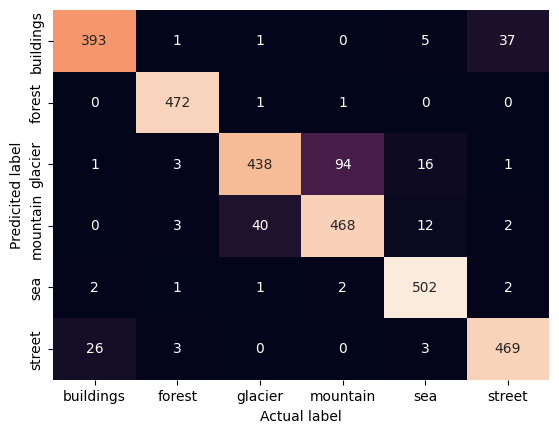

In [31]:
sns.heatmap(conf_mat, annot=True, cbar=False, fmt='.0f', yticklabels=classnames, xticklabels=classnames)
plt.xlabel('Actual label')
plt.ylabel('Predicited label');

In [32]:
def plot_roc_curve_Multiclass(y_true_binarized, y_proba, n_class):
    """
    :param y_true_binarized: y_true with same number of column as y_proba
    :param y_proba: probalities of a class is one thing or another
    :param nclass: number of class
    :return:
    """
    from sklearn.metrics import roc_curve, auc, roc_auc_score

    fig, ax = plt.subplots(figsize=(10, 6))

    # roc cure for classes
    fpr = {}  # fpr, for each classes
    tpr = {}  # tpr for each classes
    thresh = {}  # thresh for each classes
    roc_auc = {}

    for i in range(len(n_class)):
        # compute roc_curve for each class and store it into fpr, tpr, thresh
        fpr[i], tpr[i], thresh[i] = roc_curve(y_true_binarized[:, i], y_proba[:, i])
        # compute roc_auc_score for each class
        roc_auc[i] = auc(fpr[i], tpr[i])
        # plot
        ax.plot(fpr[i], tpr[i], linestyle='--', label='%s vs Rest (AUC=%.2f)' %
                                                      (n_class[i], roc_auc[i]))
        # we can test: roc_auc_score(y_true_binarized[:, i], y_proba[:, i])

    # plot baseline
    ax.plot([0, 1], [0, 1], color='red')
    # labels
    plt.xlabel("False Positive Rate (fpr)")
    plt.ylabel("True Positive Rate (tpr)")
    plt.title("Multiclass Receiver Operator Characteristic (ROC) curve")
    plt.legend()

In [33]:
label_binarize(val_data.labels, classes=np.unique(val_data.labels))

array([[1, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0],
       ...,
       [0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 1]])

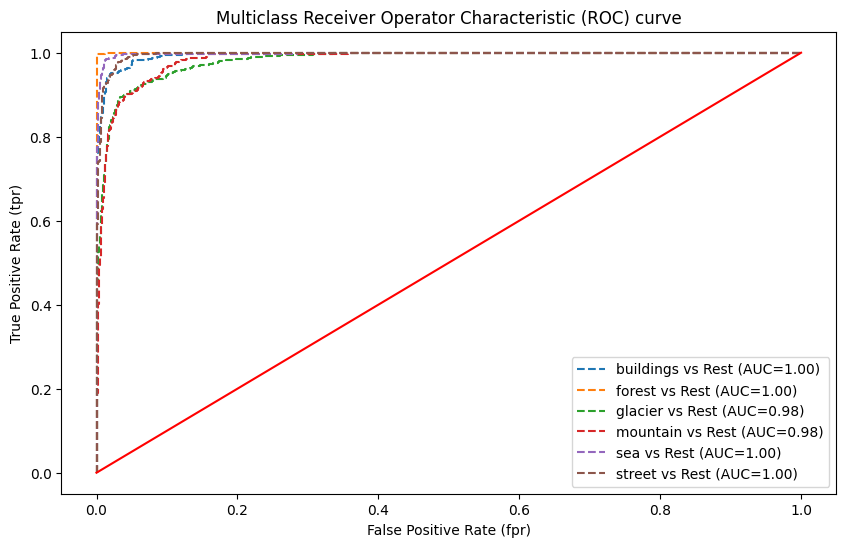

In [34]:
plot_roc_curve_Multiclass(label_binarize(val_data.labels, classes=np.unique(val_data.labels)), resnet_v1_probs, classnames)

## 10. Check the most wrong predictions

In [36]:
import pandas as pd

In [37]:
preds_df = pd.DataFrame({
    "filepath": val_data.filepaths,
    "true_label": val_data.labels,
    "pred_label": resnet_v1_preds,
    "true_class": [classnames[label] for label in val_data.labels.tolist()],
    "pred_class": [classnames[label] for label in resnet_v1_preds.tolist()],
    "pred_probs": np.max(resnet_v1_probs, axis=1)
})

preds_df

,filepath,true_label,pred_label,true_class,pred_class,pred_probs
0,intel/val/buildings/20057.jpg,0,0,buildings,buildings,0.999915
1,intel/val/buildings/20060.jpg,0,0,buildings,buildings,0.960287
2,intel/val/buildings/20061.jpg,0,0,buildings,buildings,0.998174
3,intel/val/buildings/20064.jpg,0,0,buildings,buildings,0.998107
4,intel/val/buildings/20073.jpg,0,0,buildings,buildings,0.999954
...,...,...,...,...,...,...
2995,intel/val/street/24292.jpg,5,5,street,street,0.999537
2996,intel/val/street/24300.jpg,5,5,street,street,0.936290
2997,intel/val/street/24315.jpg,5,4,street,sea,0.868204
2998,intel/val/street/24317.jpg,5,5,street,street,0.881653


In [38]:
preds_df['is_pred_correct'] = preds_df['true_class'] == preds_df['pred_class']
preds_df

,filepath,true_label,pred_label,true_class,pred_class,pred_probs,is_pred_correct
0,intel/val/buildings/20057.jpg,0,0,buildings,buildings,0.999915,True
1,intel/val/buildings/20060.jpg,0,0,buildings,buildings,0.960287,True
2,intel/val/buildings/20061.jpg,0,0,buildings,buildings,0.998174,True
3,intel/val/buildings/20064.jpg,0,0,buildings,buildings,0.998107,True
4,intel/val/buildings/20073.jpg,0,0,buildings,buildings,0.999954,True
...,...,...,...,...,...,...,...
2995,intel/val/street/24292.jpg,5,5,street,street,0.999537,True
2996,intel/val/street/24300.jpg,5,5,street,street,0.936290,True
2997,intel/val/street/24315.jpg,5,4,street,sea,0.868204,False
2998,intel/val/street/24317.jpg,5,5,street,street,0.881653,True


In [39]:
wrong_preds = preds_df[preds_df['is_pred_correct']== False]
wrong_preds

,filepath,true_label,pred_label,true_class,pred_class,pred_probs,is_pred_correct
7,intel/val/buildings/20083.jpg,0,5,buildings,street,0.971811,False
22,intel/val/buildings/20246.jpg,0,5,buildings,street,0.727707,False
25,intel/val/buildings/20294.jpg,0,5,buildings,street,0.960107,False
26,intel/val/buildings/20309.jpg,0,5,buildings,street,0.776005,False
51,intel/val/buildings/20574.jpg,0,5,buildings,street,0.974261,False
...,...,...,...,...,...,...,...
2882,intel/val/street/23228.jpg,5,0,street,buildings,0.540849,False
2908,intel/val/street/23530.jpg,5,4,street,sea,0.493066,False
2925,intel/val/street/23689.jpg,5,0,street,buildings,0.992350,False
2937,intel/val/street/23795.jpg,5,0,street,buildings,0.901607,False


In [40]:
wrong_pred_sorted = wrong_preds.sort_values(by='pred_probs', ascending=False)
wrong_pred_sorted

,filepath,true_label,pred_label,true_class,pred_class,pred_probs,is_pred_correct
1972,intel/val/mountain/24245.jpg,3,4,mountain,sea,0.999904,False
1433,intel/val/glacier/24126.jpg,2,4,glacier,sea,0.999523,False
1294,intel/val/glacier/23027.jpg,2,4,glacier,sea,0.999175,False
88,intel/val/buildings/20846.jpg,0,5,buildings,street,0.998833,False
1342,intel/val/glacier/23450.jpg,2,4,glacier,sea,0.997492,False
...,...,...,...,...,...,...,...
2838,intel/val/street/22895.jpg,5,1,street,forest,0.421313,False
1359,intel/val/glacier/23603.jpg,2,4,glacier,sea,0.369284,False
2066,intel/val/sea/20687.jpg,4,2,sea,glacier,0.340212,False
355,intel/val/buildings/23442.jpg,0,4,buildings,sea,0.337724,False


In [41]:
wrong_pred_sorted.head(10)

,filepath,true_label,pred_label,true_class,pred_class,pred_probs,is_pred_correct
1972,intel/val/mountain/24245.jpg,3,4,mountain,sea,0.999904,False
1433,intel/val/glacier/24126.jpg,2,4,glacier,sea,0.999523,False
1294,intel/val/glacier/23027.jpg,2,4,glacier,sea,0.999175,False
88,intel/val/buildings/20846.jpg,0,5,buildings,street,0.998833,False
1342,intel/val/glacier/23450.jpg,2,4,glacier,sea,0.997492,False
434,intel/val/buildings/24290.jpg,0,5,buildings,street,0.996949,False
1724,intel/val/mountain/22160.jpg,3,2,mountain,glacier,0.996467,False
254,intel/val/buildings/22426.jpg,0,5,buildings,street,0.995937,False
998,intel/val/glacier/20745.jpg,2,3,glacier,mountain,0.995706,False
205,intel/val/buildings/22031.jpg,0,5,buildings,street,0.995103,False


In [42]:
most_wrong_preds = wrong_pred_sorted[wrong_pred_sorted['pred_probs']>0.9]
most_wrong_preds

,filepath,true_label,pred_label,true_class,pred_class,pred_probs,is_pred_correct
1972,intel/val/mountain/24245.jpg,3,4,mountain,sea,0.999904,False
1433,intel/val/glacier/24126.jpg,2,4,glacier,sea,0.999523,False
1294,intel/val/glacier/23027.jpg,2,4,glacier,sea,0.999175,False
88,intel/val/buildings/20846.jpg,0,5,buildings,street,0.998833,False
1342,intel/val/glacier/23450.jpg,2,4,glacier,sea,0.997492,False
...,...,...,...,...,...,...,...
2770,intel/val/street/22351.jpg,5,0,street,buildings,0.908394,False
1048,intel/val/glacier/21144.jpg,2,4,glacier,sea,0.907990,False
1495,intel/val/mountain/20356.jpg,3,2,mountain,glacier,0.904126,False
1071,intel/val/glacier/21290.jpg,2,3,glacier,mountain,0.902467,False


In [43]:
wrong_pred_sorted.loc[1071]

filepath           intel/val/glacier/21290.jpg
true_label                                   2
pred_label                                   3
true_class                             glacier
pred_class                            mountain
pred_probs                            0.902467
is_pred_correct                          False
Name: 1071, dtype: object

In [44]:
wrong_pred_sorted.loc[[88, 1342]]['filepath'].values

array(['intel/val/buildings/20846.jpg', 'intel/val/glacier/23450.jpg'],
      dtype=object)

In [57]:
def plot_wrong_preds(df):
  indices = df.index.tolist()
  random_indices = random.sample(indices, 4)
  filepaths = df.loc[random_indices]['filepath'].values.tolist()
  true_class = df.loc[random_indices]['true_class'].values.tolist()
  pred_class = df.loc[random_indices]['pred_class'].values.tolist()
  pred_probs = df.loc[random_indices]['pred_probs'].values.tolist()


  plt.figure(figsize=(11, 9))

  for i in range(len(filepaths)):
    plt.subplot(2, 2, i + 1)
    img = plt.imread(filepaths[i])
    plt.imshow(img)
    plt.title(f'True class: {true_class[i]}\n Pred class: {pred_class[i]} \n Pred_prob: {pred_probs[i]:.2f}')

    plt.axis(False)


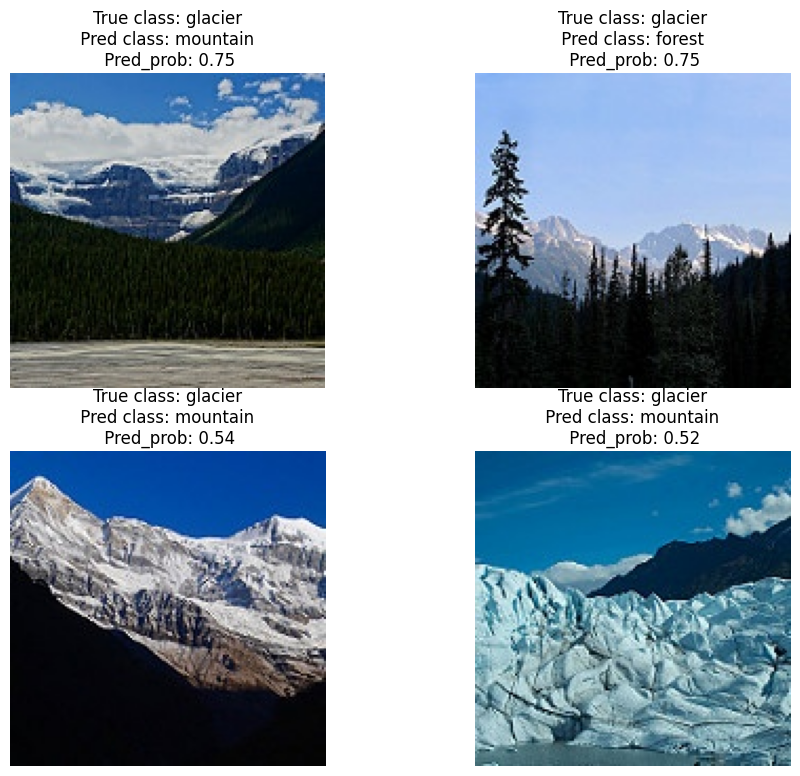

In [62]:
plot_wrong_preds(wrong_pred_sorted)

## 11. Test the models on the real world data

In [113]:
def preprocess_img(img_file_path):
  img = tf.io.read_file(img_file_path)
  img = tf.image.decode_image(img)
  img = tf.image.resize(img, size=[224, 224])
  img = img/255.

  # plt.imshow(img)

  return img




In [114]:
preprocess_img('forest_1.jpg').shape

TensorShape([224, 224, 3])

In [162]:
def pred_and_plot(img_file_path):
  img = preprocess_img(img_file_path)
  pred = tf.argmax(resnet_v1.predict(tf.expand_dims(img, axis=0)), axis=1).numpy()[0]
  probs = np.max(resnet_v1.predict(tf.expand_dims(img, axis=0)), axis=1)
  plt.imshow(img)
  plt.title(f"Prediction: {classnames[pred]} \n Probabilities: {probs[0]:.2f}")
  plt.axis(False)

1/1 [==============================] - 1s 705ms/step


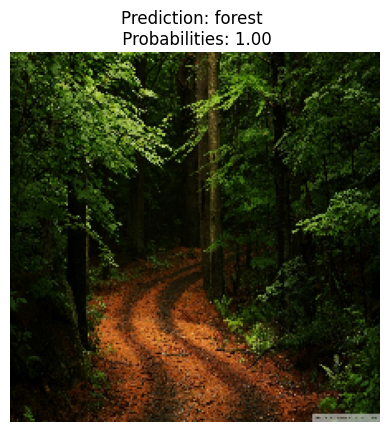

In [163]:
pred_and_plot('forest_1.jpg')

1/1 [==============================] - 0s 296ms/step


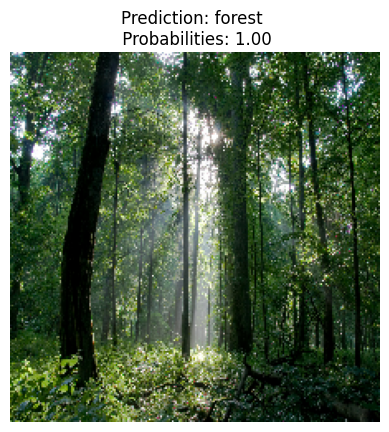

In [164]:
pred_and_plot('forest2.jpg')

1/1 [==============================] - 0s 287ms/step


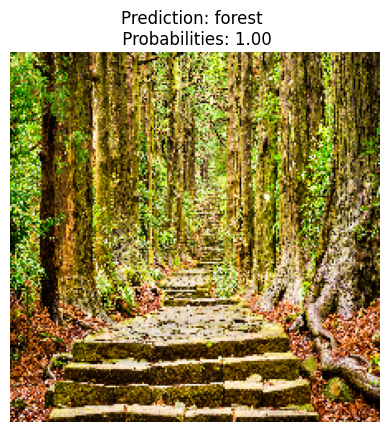

In [165]:
pred_and_plot('forest_3.jpg')

1/1 [==============================] - 0s 274ms/step


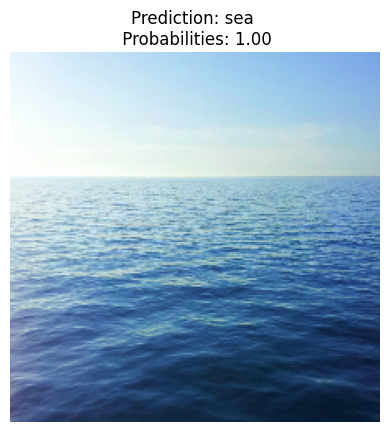

In [166]:
pred_and_plot('sea_1.jpg')

1/1 [==============================] - 1s 527ms/step


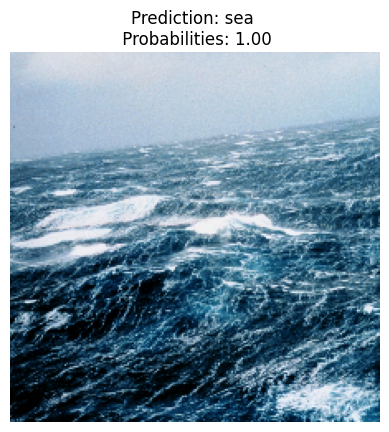

In [167]:
pred_and_plot('sea_2.jpg')

1/1 [==============================] - 0s 298ms/step


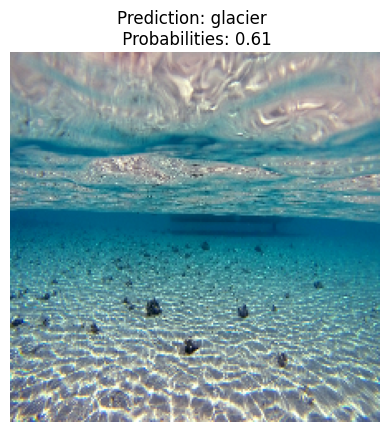

In [168]:
pred_and_plot('sea_3.jpg')

1/1 [==============================] - 1s 759ms/step


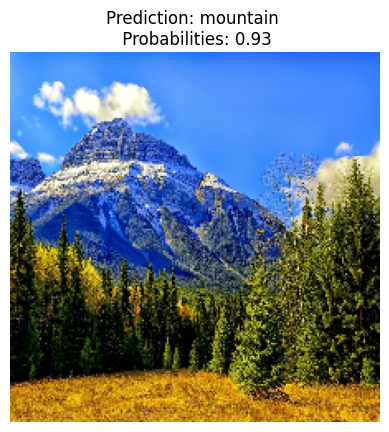

In [169]:
pred_and_plot('test.jpg')

1/1 [==============================] - 0s 495ms/step


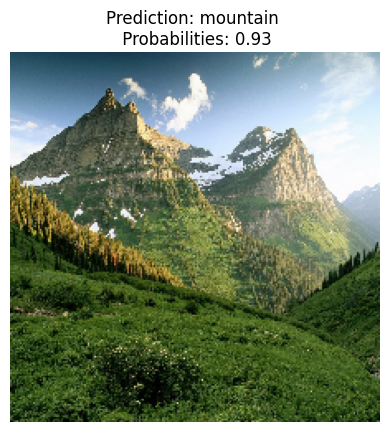

In [170]:
pred_and_plot('mountain1.jpg')

1/1 [==============================] - 1s 719ms/step


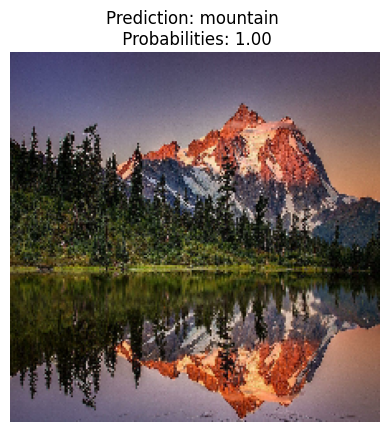

In [171]:
pred_and_plot('mountain2.jpg')

1/1 [==============================] - 1s 575ms/step


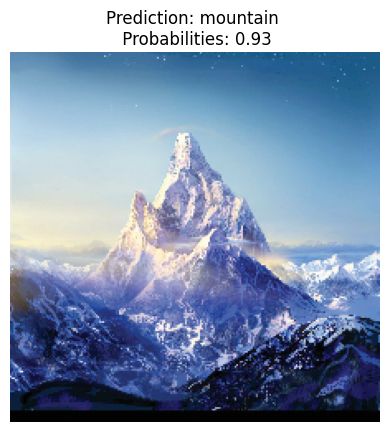

In [172]:
pred_and_plot('mountain.jpg')

1/1 [==============================] - 1s 713ms/step


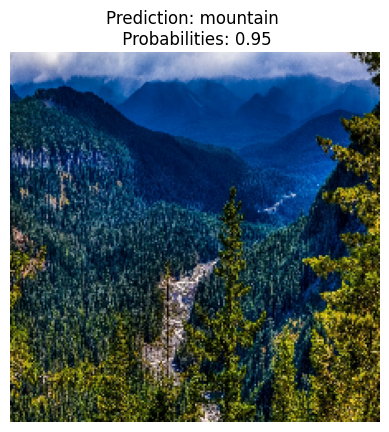

In [176]:
pred_and_plot('/content/mountain4.jpg')

1/1 [==============================] - 1s 543ms/step


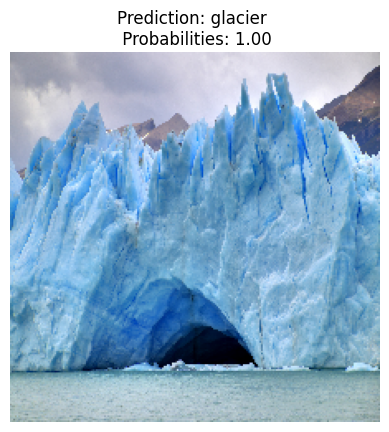

In [178]:
pred_and_plot('glacier.jpg')

1/1 [==============================] - 0s 312ms/step


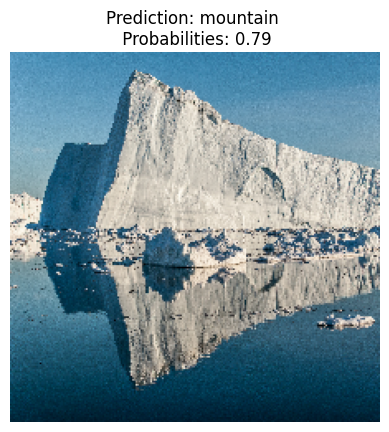

In [179]:
pred_and_plot('glacier2.jpg')

1/1 [==============================] - 1s 539ms/step


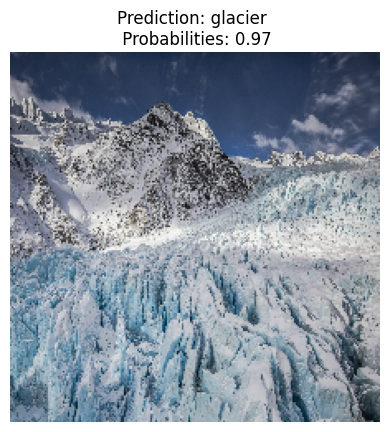

In [180]:
pred_and_plot('mountain3.jpg')

1/1 [==============================] - 1s 544ms/step


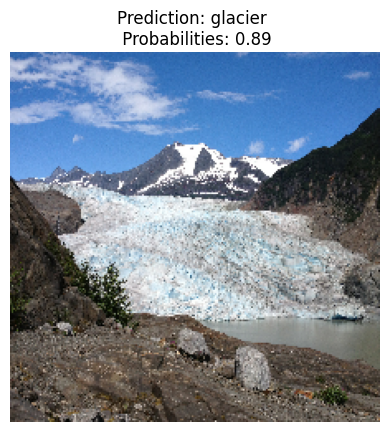

In [181]:
pred_and_plot('glacier3.jpg')

1/1 [==============================] - 1s 617ms/step


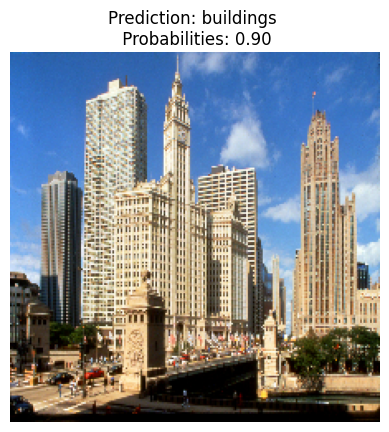

In [182]:
pred_and_plot('b.jpg')

1/1 [==============================] - 1s 520ms/step


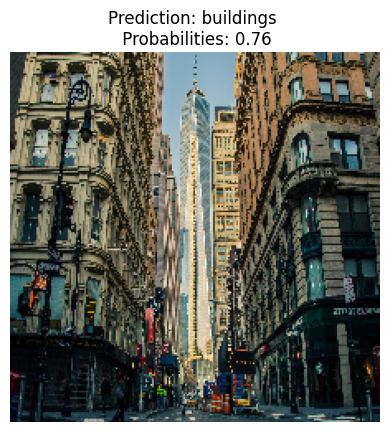

In [183]:
pred_and_plot('b2.jpg')

1/1 [==============================] - 1s 517ms/step


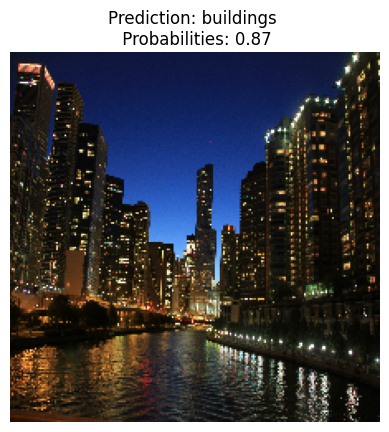

In [184]:
pred_and_plot('b3.jpg')

In [185]:
classnames

['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']

1/1 [==============================] - 0s 489ms/step


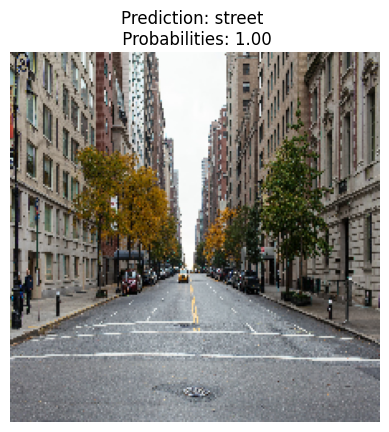

In [186]:
pred_and_plot('s.jpg')

1/1 [==============================] - 1s 575ms/step


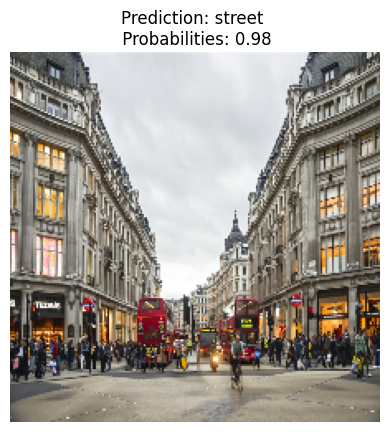

In [187]:
pred_and_plot('s2.jpg')

1/1 [==============================] - 1s 686ms/step


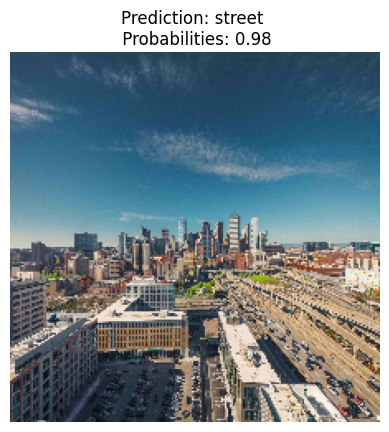

In [189]:
pred_and_plot('s3.jpeg')